In [1]:
import scanpy as sc
import scanpy.external as sce
#sc.logging.print_versions()
#sc.logging.print_memory_usage()
#sc.settings.verbosity = 2
import os,sys
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import matplotlib.ticker as mticker

In [2]:
# add the utility function folder to PATH
sys.path.append(os.path.abspath("utility_functions_190403_12h24/"))

from rz_import_statements import *
import rz_functions as rz
import rz_fig_params # this adjust mpl.rcParams, almost nothing to import, import after scanpy to overwrite rc.Params
import rz_utility_spring as srz

python version: 3.8.8



# Load data

In [3]:
adata = sc.read_h5ad('backups_JZ_2022/no_T4_lib_mito20_umi400_filt_raw_147456x33538_220120_14h39_kidney.h5ad')    

In [4]:
filename = 'backups_JZ_2022/clinical_obs_info_51196x15_220120_14h54.npz'
encoding = 'latin1'

with np.load(filename,encoding=encoding, allow_pickle = True) as f:
    obs = pd.DataFrame(**f)

In [5]:
adata.obs = obs

In [6]:
adata.obs.head()

,library,total_counts,pct_counts_mito,library2,sample,patient,pT stage,seq_date,beads,operation,sex,"tumor size, mm",age,tissue,necrosis
2,N14,449.0,0.668151,T2_1,T2,P2,pT3a,20_11_12,old,Open,Male,75,60,Tumor,Negative
19,N14,449.0,4.231626,T2_1,T2,P2,pT3a,20_11_12,old,Open,Male,75,60,Tumor,Negative
363,N14,1229.0,10.659073,T2_1,T2,P2,pT3a,20_11_12,old,Open,Male,75,60,Tumor,Negative
413,N14,732.0,4.781421,T2_1,T2,P2,pT3a,20_11_12,old,Open,Male,75,60,Tumor,Negative
433,N14,432.0,6.944445,T2_1,T2,P2,pT3a,20_11_12,old,Open,Male,75,60,Tumor,Negative


In [7]:
adata.obs['library2'].unique()

array(['T2_1', 'N3_1', 'N4_1', 'N2_1', 'T3_1', 'N6_1', 'N5_1', 'N7_1',
       'N8_1', 'T5_2', 'T6_3', 'T7_3', 'T8_3', 'T5_1', 'T6_1', 'T6_2',
       'T7_2', 'T7_1', 'T8_2', 'T8_1', 'N9_1', 'T9_1', 'T9_2', 'T9_3',
       'N1_old', 'N2_old', 'N3_old', 'N4_old', 'T2_old', 'T3_old',
       'T4_old'], dtype=object)

# Normalize counts

In [8]:
#save not normalized counts as adata.raw, can normalize any time if needed

adata.raw = adata

In [9]:
sc.pp.normalize_per_cell(adata,counts_per_cell_after=1e4)

In [10]:
adata.X.sum(axis = 1)

matrix([[10000.001],
        [10000.   ],
        [10000.001],
        ...,
        [ 9999.999],
        [ 9999.999],
        [ 9999.999]], dtype=float32)

# Save one copy of the data to master spring directory in a spring-compatible format

In [12]:
path1 = '/Users/justina/Documents/mokslai/MAGISTRAS/MAGISTRINIS/data_and_spring/SPRING_dev-master' + '/kidney_spring'
project_dir = path1+'/kidney_2022'


In [13]:
# save (once), may be slow
srz.save_counts_for_spring(adata,project_dir)
project_dir

'/Users/justina/Documents/mokslai/MAGISTRAS/MAGISTRINIS/data_and_spring/SPRING_dev-master/kidney_spring/kidney_2022'

## Select cells to keep, log-transform and z-score, choose parameters for graph construction that will be used for both SPRING (Weinreb et al., 2018) and UMAP

In [14]:

# selecting cells to plot and making a copy of the adata object

cell_mask = np.repeat(True,adata.shape[0])
cdata = adata[cell_mask].copy() # all cells in this case

# saving a copy of data before taking the log (not necessary, as raw data is in adata.raw and can be normalized any time)
cdata.uns['X_lin_cptt'] = cdata.X.copy() # for X linear counts-per-10-thousand

# log transform
sc.pp.log1p(cdata)

# zscore
sc.pp.scale(cdata)

# keep a copy of the data:
cdata.uns['X_log_z'] = cdata.X.copy()

In [15]:

#name for the spring subplot
plot_name = 'kidney_v0'

# chose dataset for selecting abundant and variable genes
# here I use linear counts-per-10k

E = cdata.uns['X_lin_cptt']

# a log of spring parameters and intermediate data structures is used in
# the form of an unstructured annotation as part of an AnnData object.

srz.start_spring_params(cdata,plot_name)

# print the newly created dictionary, also define a variable to access it faster:
pdict = cdata.uns['spring_params'][plot_name]
pdict

{'k': 5,
 'cell_mask': array([ True,  True,  True, ...,  True,  True,  True]),
 'min_counts': 3,
 'min_cells': 3,
 'base_ix': array([    0,     1,     2, ..., 51193, 51194, 51195]),
 'num_pc': 20,
 'plot_name': 'kidney_v0'}

In [16]:
# overwrite some of the parameters for SPRING
pdict['cell_mask'] = cell_mask # record which cells out of all were used
pdict['k'] = 10

pdict['min_counts'] = 10 #parameters for gene selection
pdict['min_cells'] = 5 #parameters for gene selection
pdict['embedding'] = 'umap'

print(len(pdict['base_ix'])) #number of cells used

51196


### Gene selection criteria

In [17]:
# avoid genes starting with
toavoid = ['MT-','RPS','RPL','MRPL','MRPS']
for i in toavoid:
    print(i)
    print([g for g in adata.var_names if g.startswith(i)])
    print()
    print()

MT-
['MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6', 'MT-CYB']


RPS
['RPS6KA1', 'RPS8', 'RPS27', 'RPS6KC1', 'RPS7', 'RPS27A', 'RPSA', 'RPS3A', 'RPS23', 'RPS14', 'RPS18', 'RPS10-NUDT3', 'RPS10', 'RPS12', 'RPS6KA2', 'RPS6KA2-AS1', 'RPS6KA3', 'RPS4X', 'RPS6KA6', 'RPS20', 'RPS6', 'RPS13', 'RPS6KA4', 'RPS6KB2', 'RPS6KB2-AS1', 'RPS3', 'RPS25', 'RPS24', 'RPS26', 'RPS29', 'RPS6KL1', 'RPS6KA5', 'RPS27L', 'RPS17', 'RPS2', 'RPS15A', 'RPS6KB1', 'RPS21', 'RPS15', 'RPS28', 'RPS16', 'RPS19', 'RPS11', 'RPS9', 'RPS5', 'RPS4Y1', 'RPS4Y2', 'RPS19BP1']


RPL
['RPL22', 'RPL11', 'RPL5', 'RPL31', 'RPL37A', 'RPL32', 'RPL15', 'RPL14', 'RPL29', 'RPL24', 'RPL22L1', 'RPL39L', 'RPL35A', 'RPL9', 'RPL34-AS1', 'RPL34', 'RPL37', 'RPL26L1', 'RPL10A', 'RPL7L1', 'RPL36A', 'RPL36A-HNRNPH2', 'RPL39', 'RPL10', 'RPL7', 'RPL30', 'RPL8', 'RPL35', 'RPL12', 'RPL7A', 'RPLP2', 'RPL27A', 'RPL41', 'RPL6', 'RPLP0', 'RPL21', 'RPL10L', 'RPL36AL', 'RPL4', 'RPLP1

In [18]:
# genes to exclude:
exclude_gene_names = []
for j in toavoid:
    exclude_gene_names.append([i for i in adata.var_names if i.startswith(j)])
exclude_gene_names = rz.flatten_list_of_lists(exclude_gene_names)

pdict['gene_names_excluded'] = exclude_gene_names
print('%d genes excluded based on name'%len(exclude_gene_names))


##########################################################################################

# filter on abundance:
pdict['abundant_gene_mask'] = srz.filter_abund_genes(
                                                     E[pdict['base_ix'],:],
                                                     pdict['min_counts'],
                                                     pdict['min_cells']
                                                    )

197 genes excluded based on name
18821 genes passing abundance filter


In [19]:
# combine gene filters so far
undesired = list(pdict['gene_names_excluded'])+\
            list(cdata.var_names[~pdict['abundant_gene_mask']])

print(len(undesired))
undesired = list(set(undesired))
print(len(undesired))

# boolean mask
combmask = ~np.in1d(cdata.var_names,undesired)
print(combmask.sum(),'surviving genes so far')

14914
14906
18632 surviving genes so far


In [20]:
# calculate v score (Klein et al., 2015, see equation S4 and S13) for all non-zero genes
# the function automatically removes genes with zero expression, but better
# to get rid of these in advance at this point.

isexpr = np.array(E[pdict['base_ix'],:].sum(axis=0))[0]>0
print('%d genes with non-zero expression'%sum(isexpr))
pdict['v_score_dict'] = srz.vscores(E[pdict['base_ix'],:][:,isexpr])

# print the number of genes with v scores above mode
# these but not more can be considered variable

maxvar = pdict['v_score_dict']['var_gene_mask'][combmask[isexpr]].sum()
print("Out of the surviving genes, %d have a v-score above mode"%maxvar)

28047 genes with non-zero expression
Out of the surviving genes, 15554 have a v-score above mode


In [21]:
# out of the surviving genes, select a fix number of most variable ones
# this is one of the possible strategies

nrvar = 2000
pdict['nr_var_genes'] = nrvar

# place v score and gene names into a temporary pd.Series for convenience:
v = pd.Series(pdict['v_score_dict']['v_scores'],index=cdata.var_names[isexpr])


# get the names of the top most variable genes:
pdict['genes_used'] = v[combmask[isexpr]].sort_values(ascending=False)[:nrvar].index

# plot a v score vs mean plot with genes used further colored in red
ff = pdict['v_score_dict']['ff_gene']
mu = pdict['v_score_dict']['mu_gene']
finalmask = np.in1d(cdata.var_names,pdict['genes_used'])

findfont: Font family ['Myriad Pro'] not found. Falling back to DejaVu Sans.


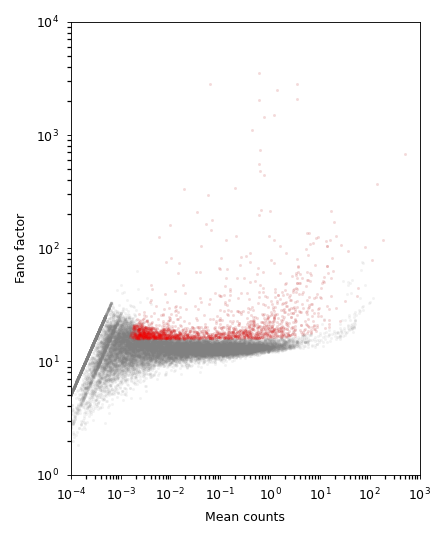

In [22]:
# check scatter
s = 2
plt.figure(figsize=(3,4))
plt.scatter(mu,ff,lw=0,color='0.5',alpha=0.1,s=s)
plt.scatter(mu[finalmask[isexpr]],ff[finalmask[isexpr]],lw=0,color='r',alpha=0.1,s=s)
plt.xscale('log');
plt.yscale('log');
plt.xlim(0.0001,1000)
plt.ylim(1,10000)
plt.xlabel('Mean counts')
plt.ylabel('Fano factor');
#plt.savefig(project_dir, dpi = 600)

### Apply gene filter and perform PCA

In [23]:
# leave only genes defined as variable, overwrite
print(cdata.shape)
finalmask = np.in1d(cdata.var_names,pdict['genes_used'])
cdata = cdata[:,finalmask]
print(cdata.shape)

(51196, 33538)
(51196, 2000)


In [24]:
# Z score was calculated already, placing it in a separate variable
Z = cdata.X.copy()

In [25]:
# find the number of non-random PCs
d = srz.find_num_pc(Z[pdict["base_ix"],:],sparse=False)

calculating the first 200 observed eigenvalues...
calculating the random eigenvalues for 10 rounds of shuffling...
1 	 87 	 0.70 min.
2 	 88 	 1.20 min.
3 	 86 	 1.70 min.
4 	 88 	 2.17 min.
5 	 88 	 2.67 min.
6 	 91 	 3.15 min.
7 	 88 	 3.62 min.
8 	 91 	 4.07 min.
9 	 90 	 4.53 min.
10 	 92 	 5.02 min.


In [26]:
# record results to log:
pdict['num_pc'] = d['num_pc']
pdict['eigenvectors'] = d['pca'].components_
pdict['eigenvalues'] = d['pca'].explained_variance_


print(d['num_pc'])


86


In [27]:
# apply dimensionality reduction on Z (get principle components)
# note, that eigenvalues can be calculated for base_ix only
# make sure to provide a dense matrix Z

P = pdict['eigenvectors'][:pdict['num_pc'],:].dot(Z.T).T
print(P.shape)

(51196, 86)


In [28]:
#Here I store these values in adata as if scanpy pca was ran for convenience

In [29]:
cdata.obsm['X_pca'] = P
cdata.varm['PCs'] = pdict['eigenvectors'][:pdict['num_pc'],:].T
cdata.uns['pca'] = {}

cdata.uns['pca']['variance'] = pdict['eigenvalues']

## Batch correction using Harmony

This notebook was first ran without batch correction and UMAPs were plotted colored by all possible clinical and technical variables. A batch effect was observed for a technical variable "beads", which denotes the version of barcoding beads used in cell barcoding experiments. 
Here I choose a conservative approach to batch correction that does not involve "correction" of the actual counts in the martix but rather improves the embedding by bringing the batches closer in the PCA space that further leads to more appropriate clustering of phenotypes despite the batch label. One of the best-scoring benchmarked methods, Harmony, is used for this task. (Korsunsky et al., 2019, 
https://www.nature.com/articles/s41592-019-0619-0)

After batch correction the Harmony-corrected PCA coordinates are used for graph construction. 

In [30]:
sce.pp.harmony_integrate(cdata, 'beads', max_iter_harmony = 15)

2022-01-20 17:47:59,242 - harmonypy - INFO - Iteration 1 of 15
2022-01-20 17:48:09,785 - harmonypy - INFO - Iteration 2 of 15
2022-01-20 17:50:44,979 - harmonypy - INFO - Iteration 3 of 15
2022-01-20 17:50:52,750 - harmonypy - INFO - Iteration 4 of 15
2022-01-20 17:51:02,925 - harmonypy - INFO - Iteration 5 of 15
2022-01-20 17:51:11,115 - harmonypy - INFO - Iteration 6 of 15
2022-01-20 17:51:19,342 - harmonypy - INFO - Iteration 7 of 15
2022-01-20 17:51:29,335 - harmonypy - INFO - Iteration 8 of 15
2022-01-20 17:51:34,119 - harmonypy - INFO - Converged after 8 iterations


After intergation of batches, I am checking if the batch correction worked properly. Neighbor number or umap parameters will be adjusted later. Inspecting whether batch correction distorted the embedding - coloring by other variables and looking if there are any immediate (undesired) changes.

It does not seem to be the case.


In [31]:
sc.pp.neighbors(cdata, 15, use_rep = 'X_pca_harmony')
sc.tl.umap(cdata, min_dist = 0.7, random_state = 42)

... storing 'library' as categorical
... storing 'library2' as categorical
... storing 'sample' as categorical
... storing 'patient' as categorical
... storing 'pT stage' as categorical
... storing 'seq_date' as categorical
... storing 'beads' as categorical
... storing 'operation' as categorical
... storing 'sex' as categorical
... storing 'tissue' as categorical
... storing 'necrosis' as categorical
findfont: Font family ['Myriad Pro'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Myriad Pro'] not found. Falling back to DejaVu Sans.


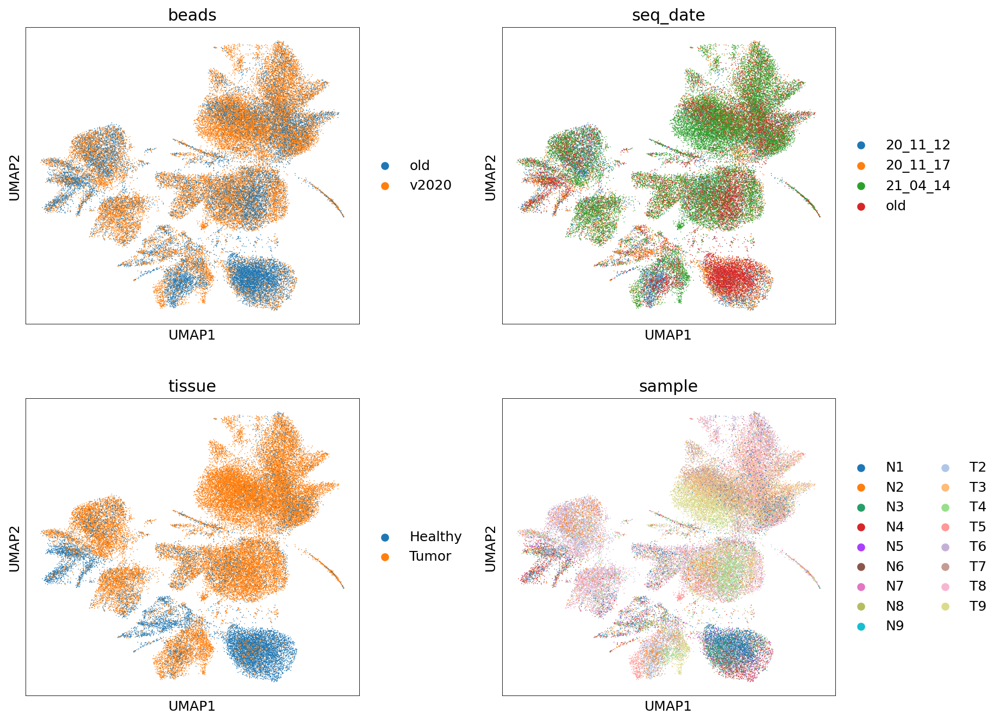

In [32]:
mpl.rcParams['figure.figsize'] = (5,5)
plt.rcParams.update({'font.size': 12})
sc.pl.umap(cdata, color = ['beads', 'seq_date', 'tissue', 'sample'], ncols = 2, wspace = 0.3, save = False)

## Choose the "optimal" UMAP parameters

Here I iterate over combinations of neighbor number for graph construction (n_neighbors) and min_dist parameter for visualization in UMAP in order to appreciate the differences in embedding upon parameter change and to select the approximate subjectively "best" structure preserving representation. 

In [33]:
neighbor_list = [5, 10, 12, 15, 20]
dist_list = [0.1, 0.3, 0.5, 0.6, 0.7]


5 neighbors


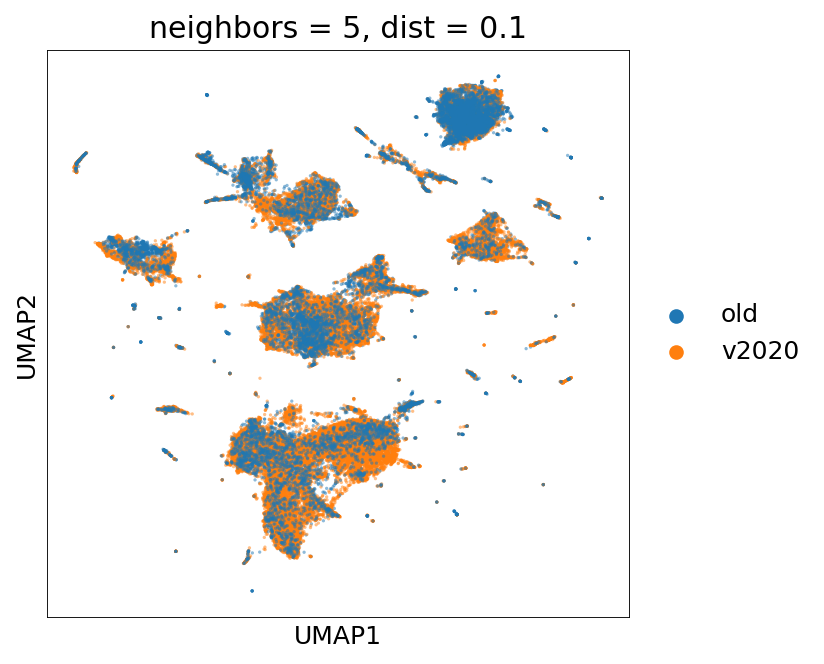

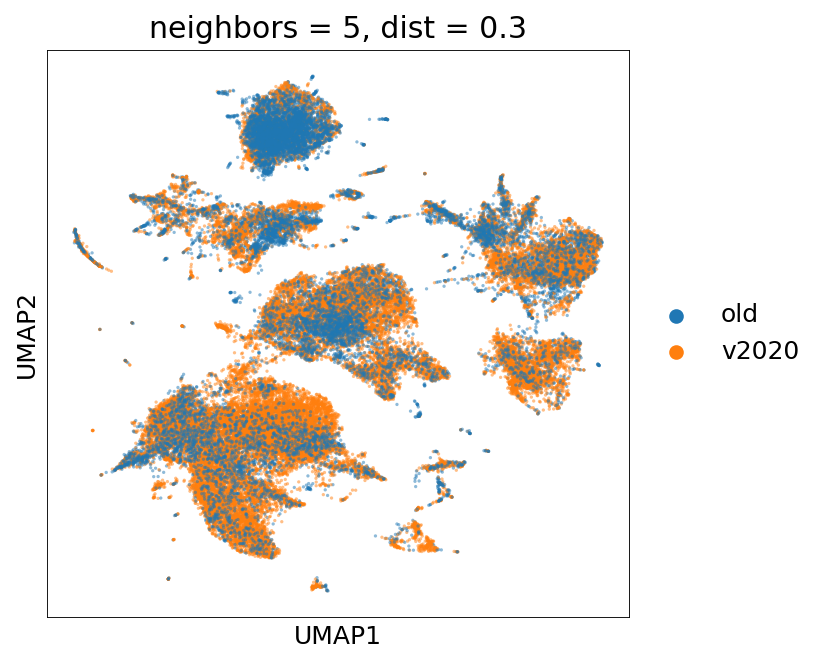

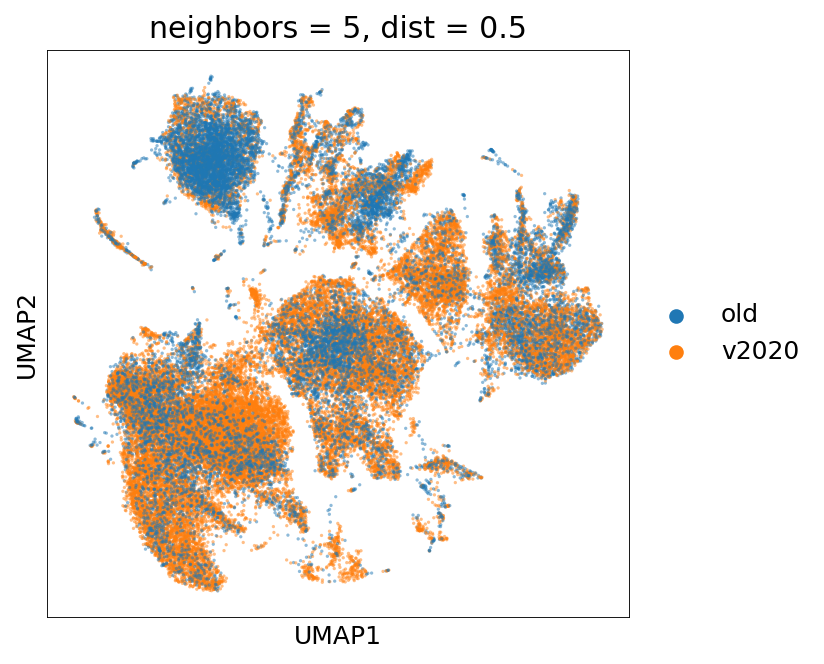

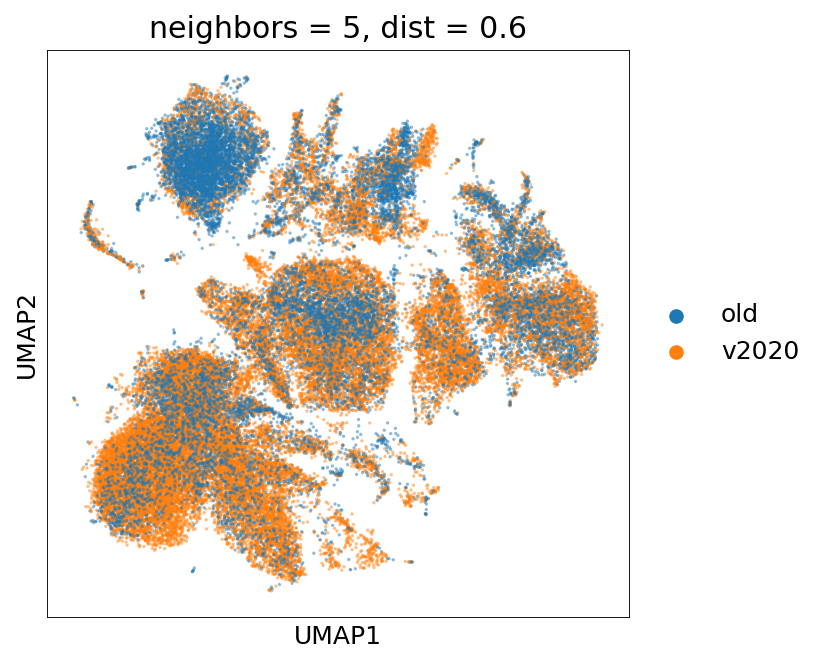

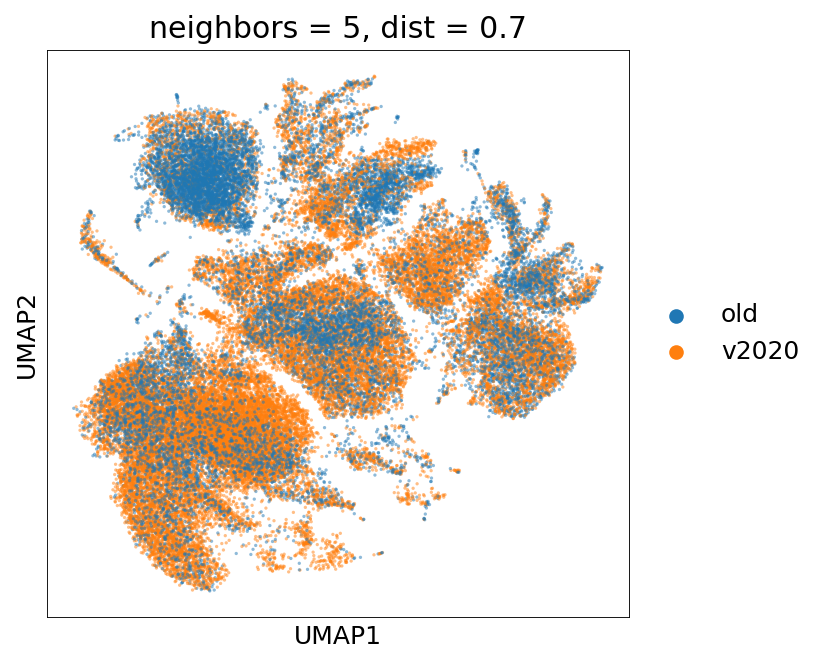

10 neighbors


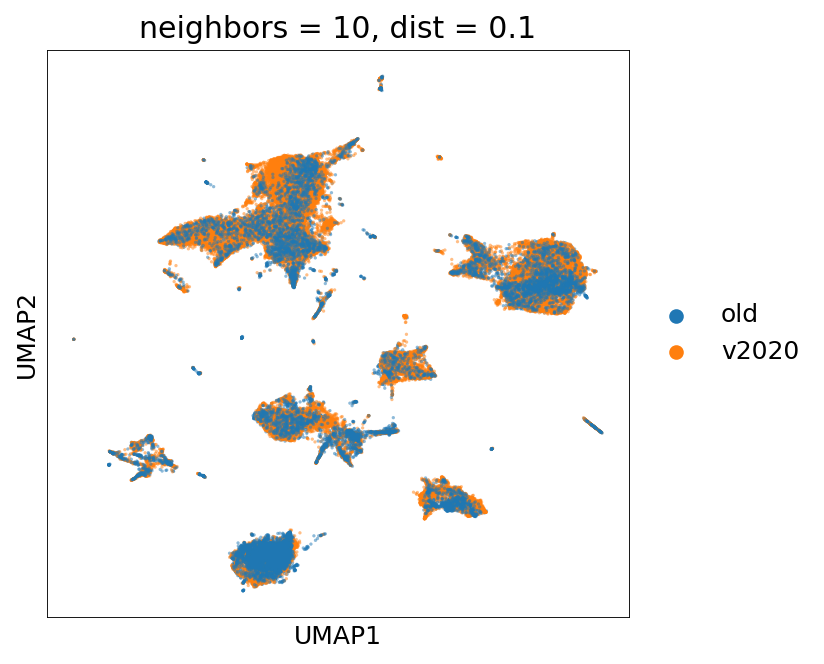

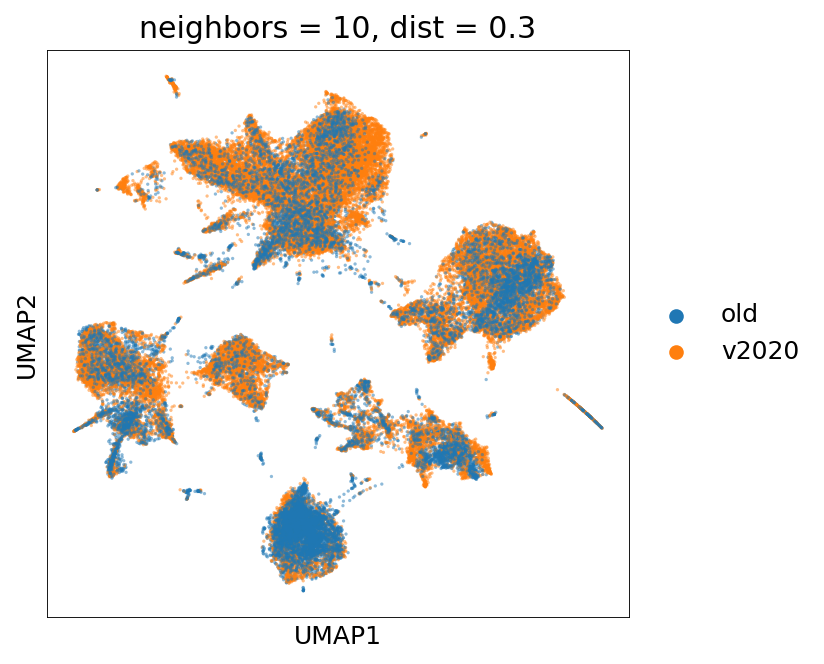

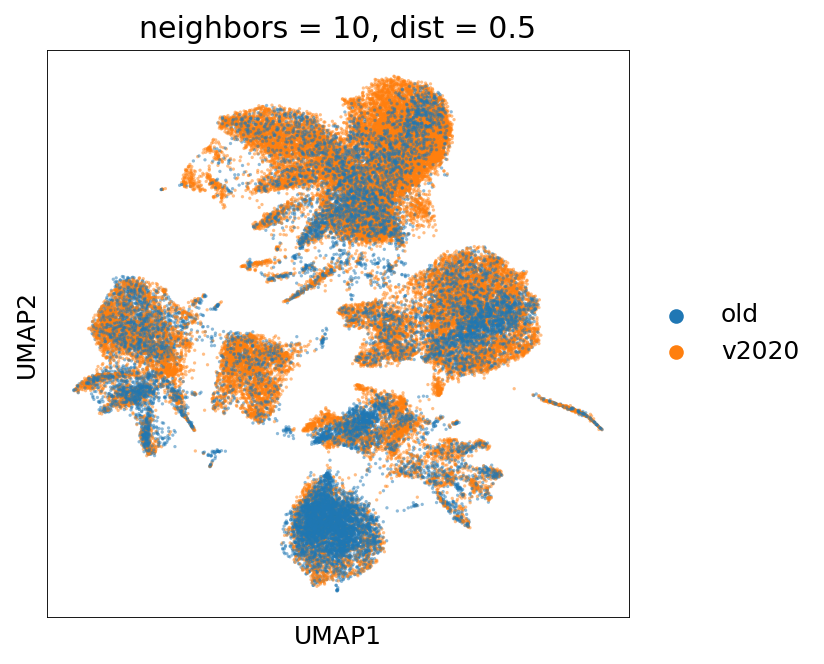

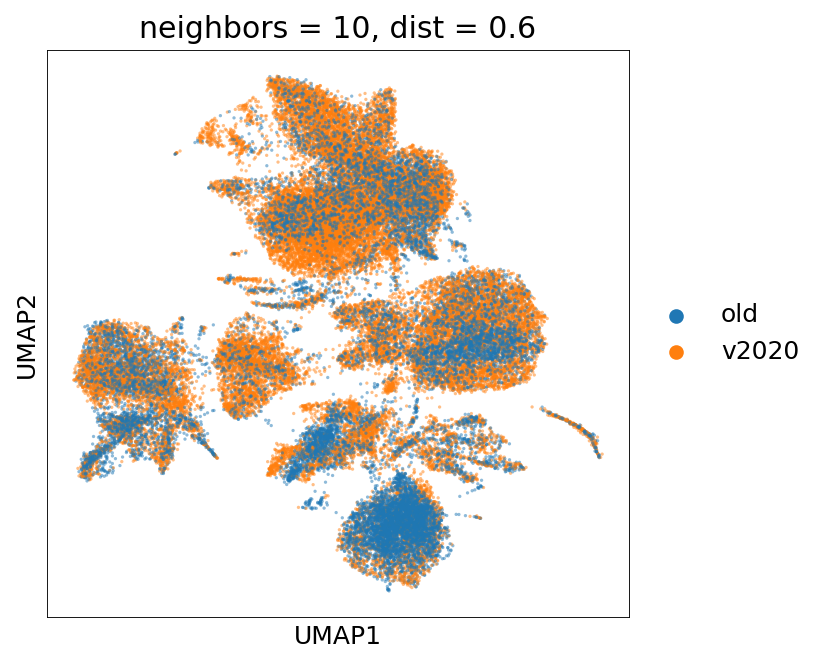

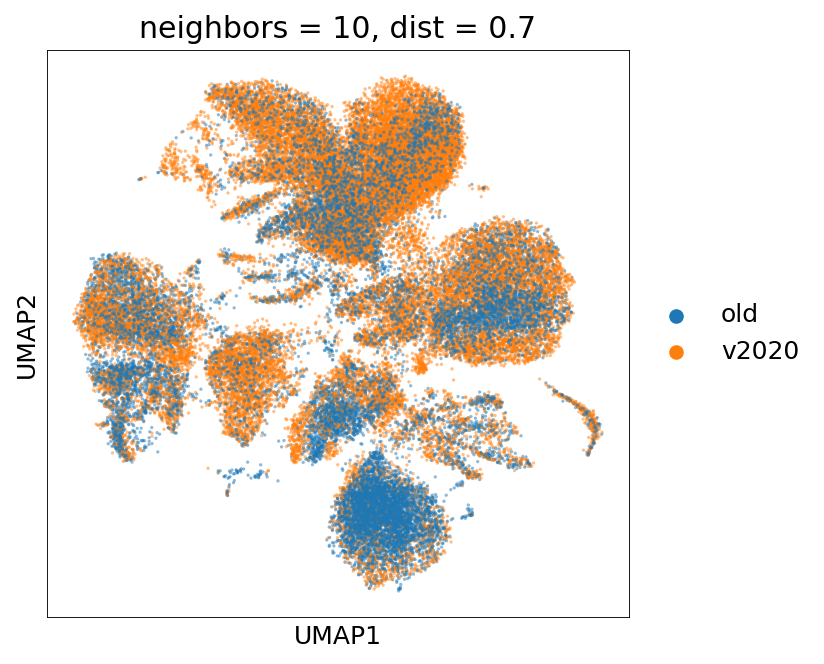

12 neighbors


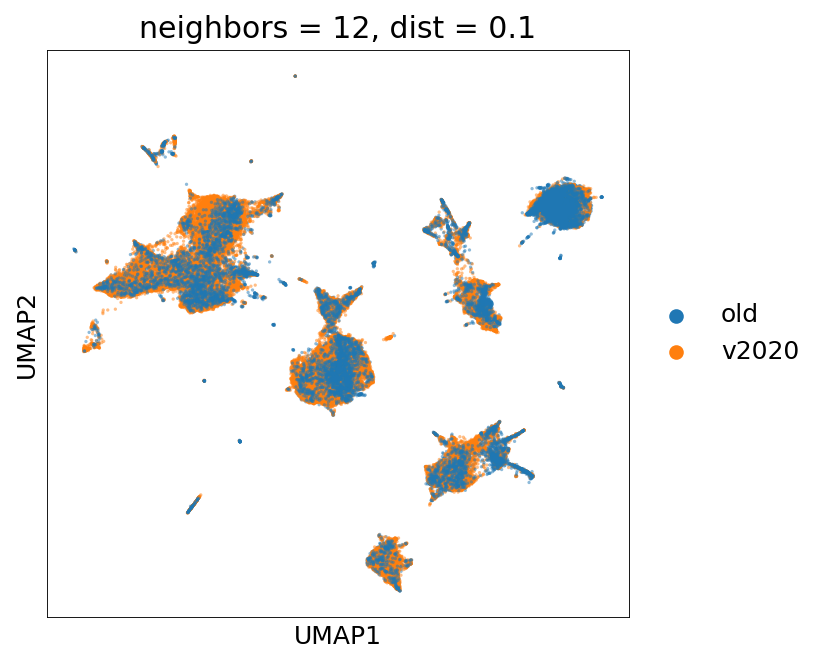

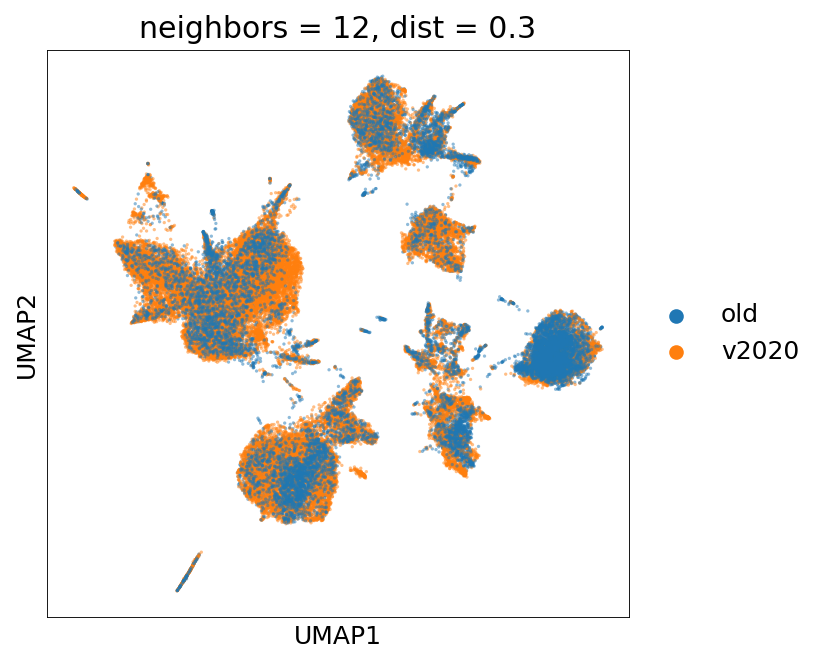

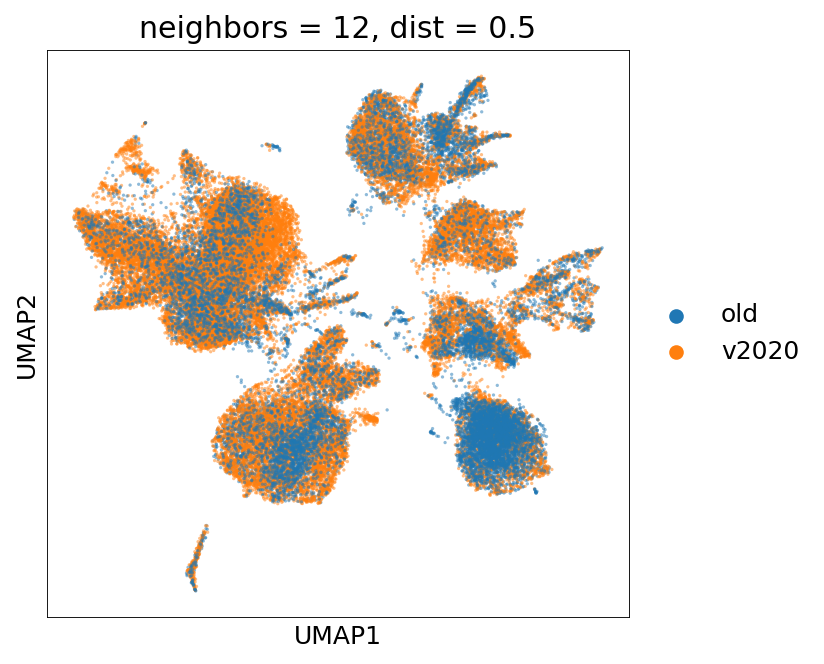

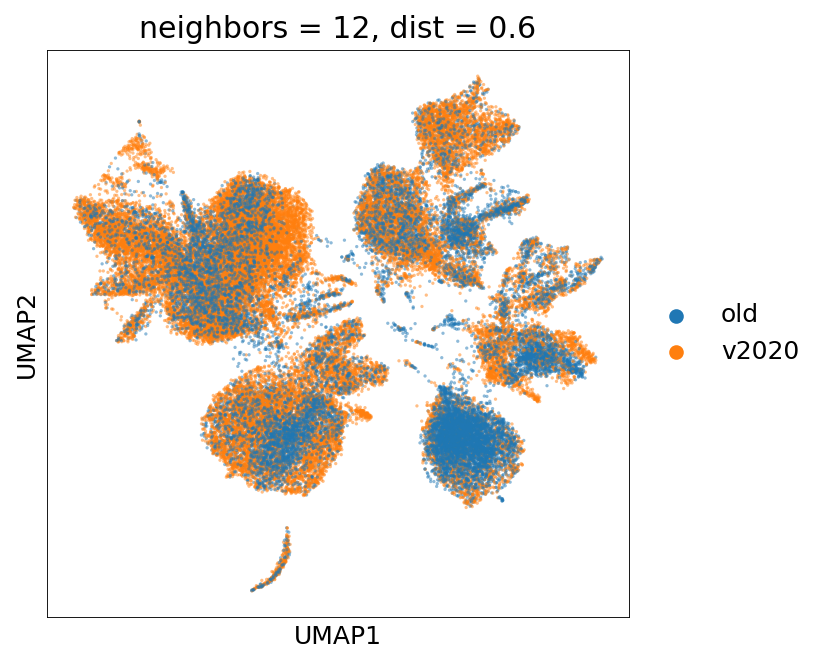

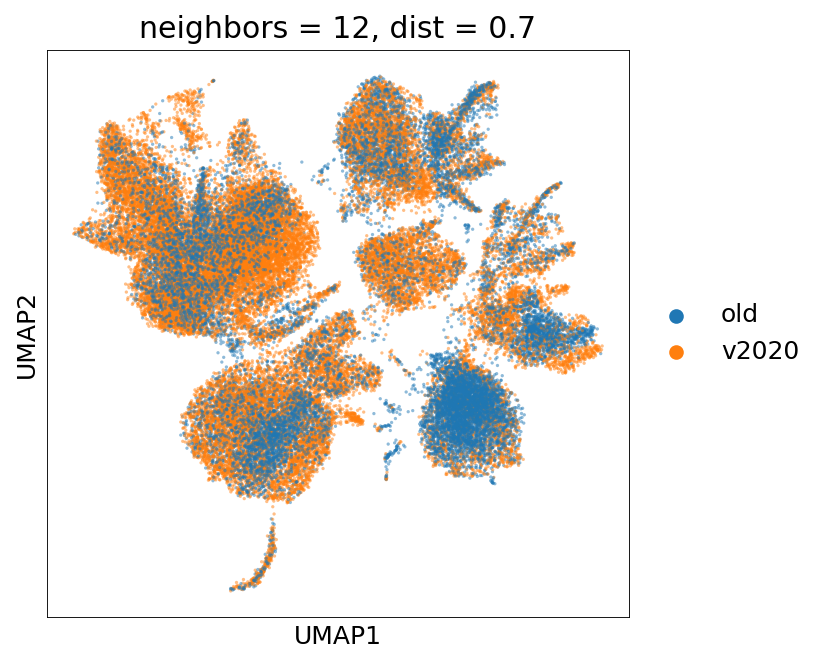

15 neighbors


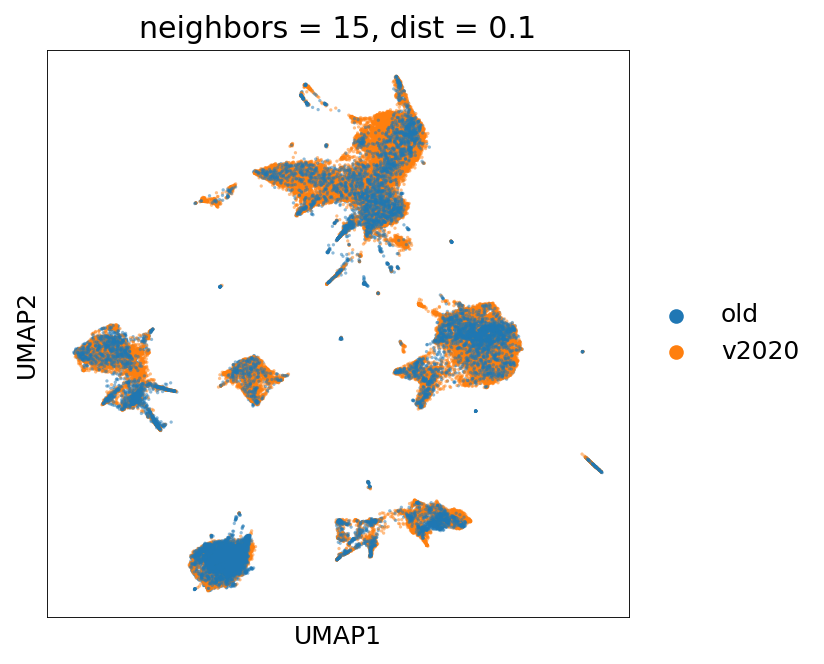

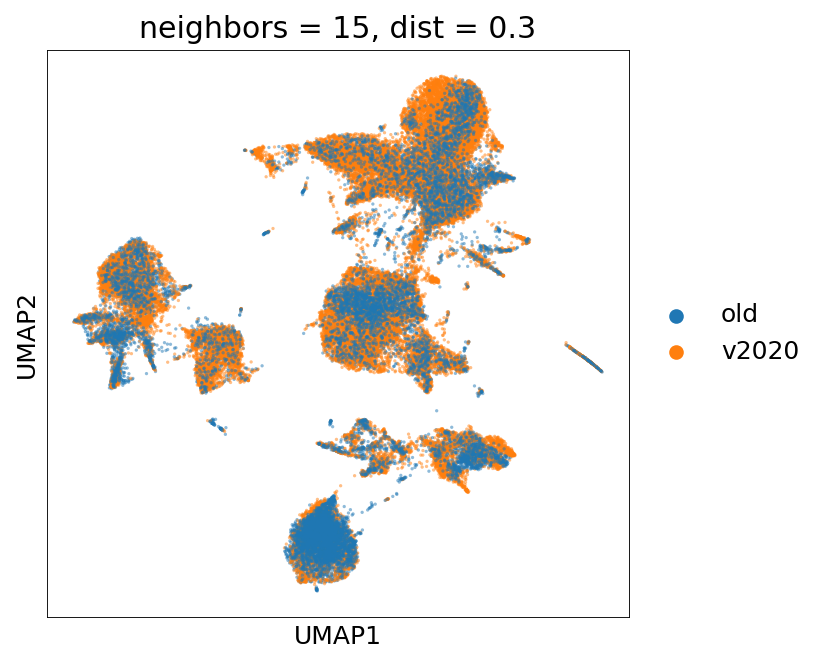

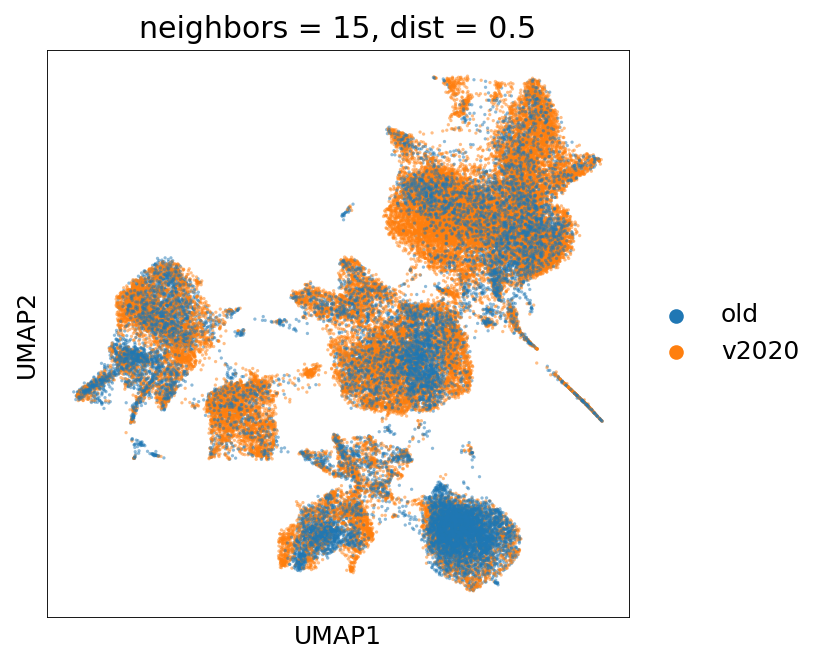

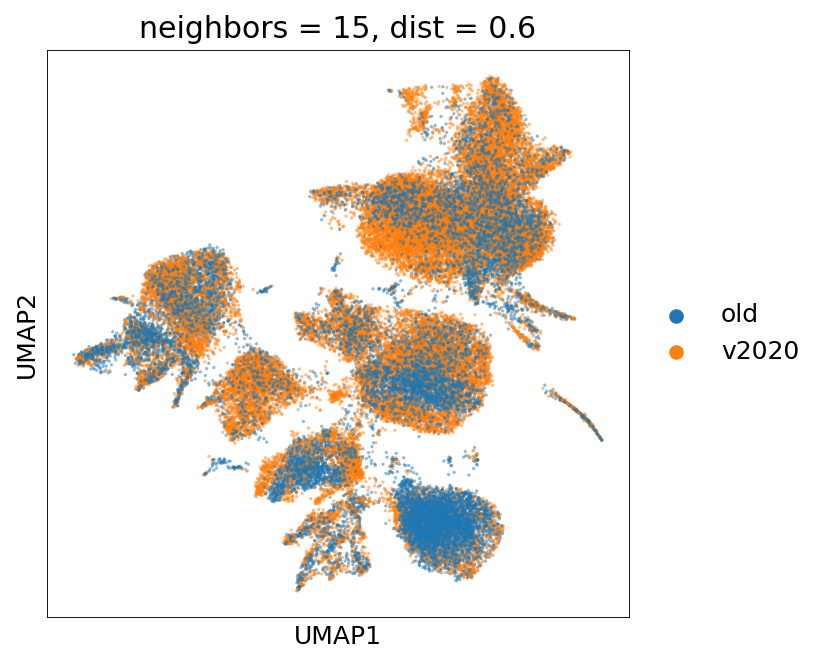

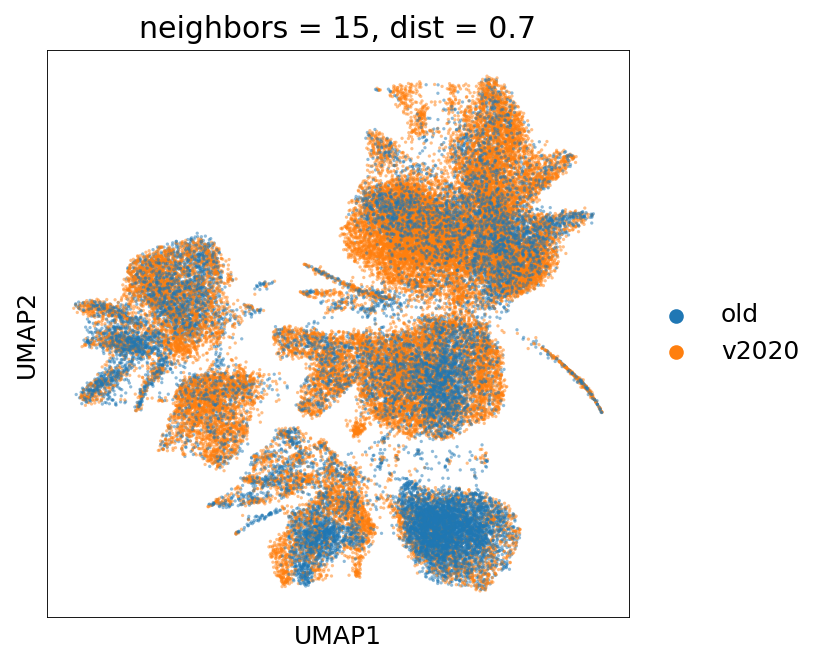

20 neighbors


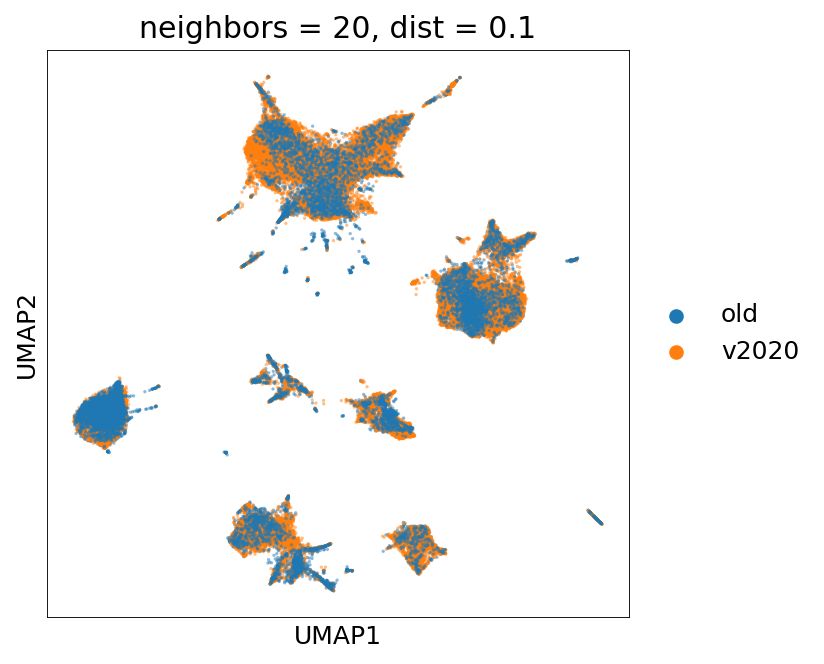

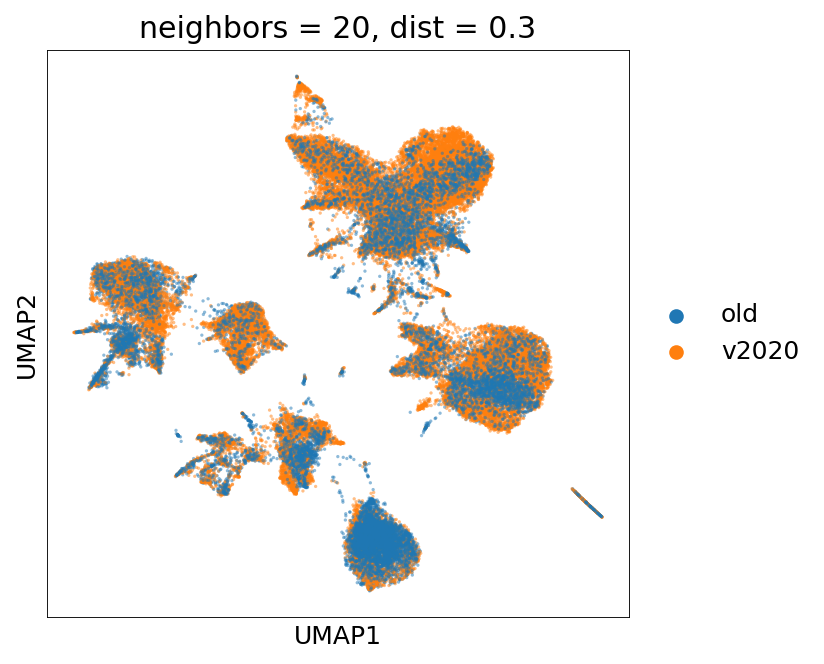

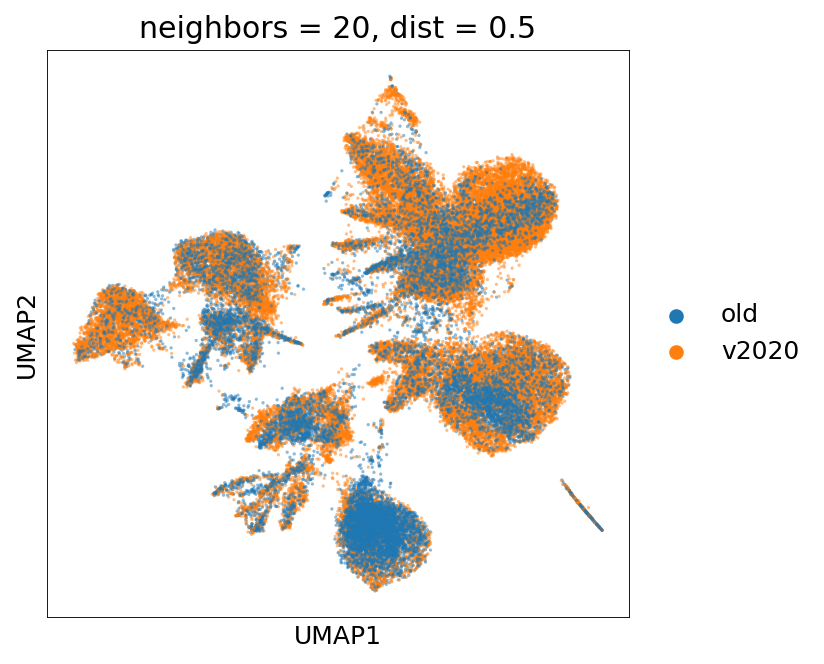

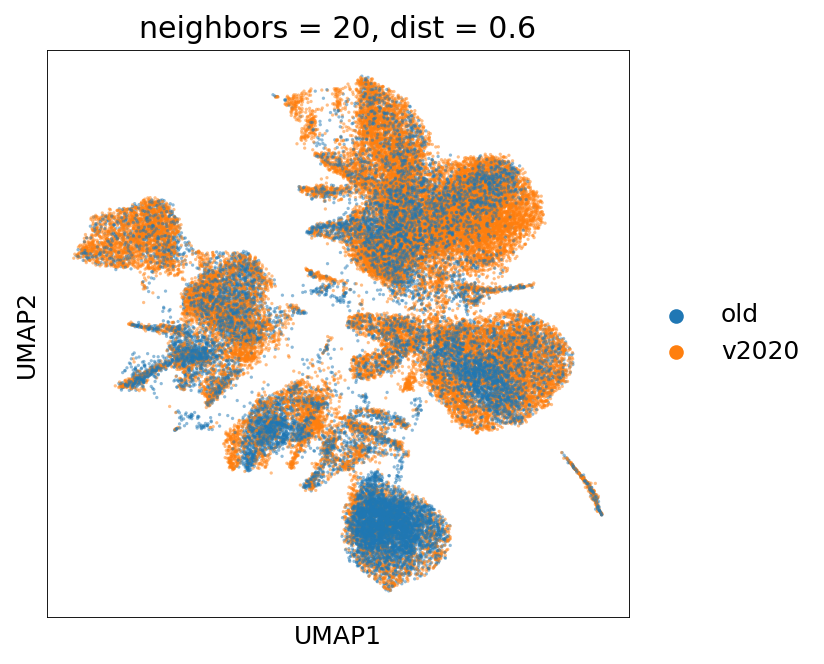

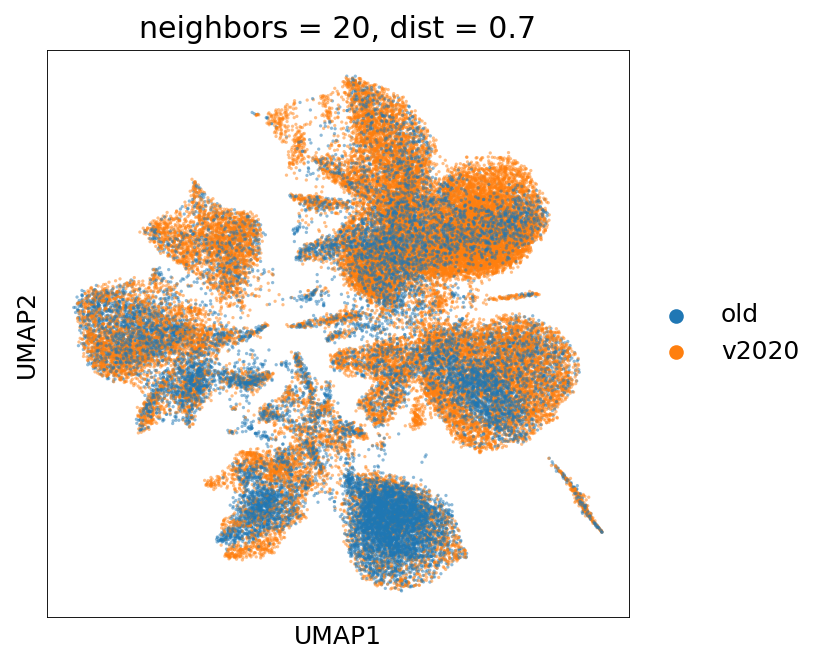

In [36]:
for j in neighbor_list:
    k = j
    print(k, 'neighbors')
    sc.pp.neighbors(cdata,k, use_rep = 'X_pca_harmony')
    for i in dist_list:
        sc.tl.umap(cdata, min_dist = i, random_state = 42)
        mpl.rcParams['figure.figsize'] = (5,5)
        sc.pl.umap(cdata, color = 'beads', use_raw = False,
                   alpha = 0.5, s=10, title = 'neighbors = %s, dist = %s'% (j,i),
                   save ='log_z_v2000_noT4_beads_corrected, neighbors = %s, dist = %s_1000.png'% (j,i))
        

## Run UMAP with the chosen parameters

Upon inspection of the different variants of the UMAP representation selecting one that seems not too spread out and not too clumped as the first version of representation that will be used to inspect interactively in the SPRING application and for further cleanup of the dataset (Weinberg et al., 2018)

In [37]:
sc.pp.neighbors(cdata, 15 ,use_rep='X_pca_harmony')
sc.tl.umap(cdata, min_dist = 0.6, random_state = 42)


In [38]:
sc.tl.draw_graph(cdata, layout='fa') #this layout seems to work better for visual doublet detection

In [39]:
cdata

AnnData object with n_obs × n_vars = 51196 × 2000
    obs: 'library', 'total_counts', 'pct_counts_mito', 'library2', 'sample', 'patient', 'pT stage', 'seq_date', 'beads', 'operation', 'sex', 'tumor size, mm', 'age', 'tissue', 'necrosis', 'n_counts'
    var: 'mean', 'std'
    uns: 'X_lin_cptt', 'log1p', 'X_log_z', 'spring_params', 'pca', 'neighbors', 'umap', 'beads_colors', 'seq_date_colors', 'tissue_colors', 'sample_colors', 'draw_graph'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'X_draw_graph_fa'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [40]:
#record the parameters
pdict['neighbors'] = 15
pdict['min_dist'] = 0.6

In [41]:
plot_name = 'kidney_v0_156_v2000'
pdict['plot_name']= plot_name

## Save UMAP and FDL coordinates for SPRING interactive viewer

In [42]:
cdata.obs.keys()

Index(['library', 'total_counts', 'pct_counts_mito', 'library2', 'sample',
       'patient', 'pT stage', 'seq_date', 'beads', 'operation', 'sex',
       'tumor size, mm', 'age', 'tissue', 'necrosis', 'n_counts'],
      dtype='object')

In [43]:
# continuous per-cell metadata
contvars = ['total_counts','pct_counts_mito', 'n_counts']

# categorical
catvars = ['library', 'library2', 'sample',
       'patient', 'pT stage', 'seq_date', 'beads', 'operation', 'sex',
        'age', 'tumor size, mm', 'tissue', 'necrosis']


In [44]:
# export_spring_plot was complaining about the data format, force the right one
for contvar in contvars:
    cdata.obs[contvar] = cdata.obs[contvar].astype(float).values
    
for catvar in catvars:
    cdata.obs[catvar] = cdata.obs[catvar].astype(str).values

... storing 'library' as categorical
... storing 'library2' as categorical
... storing 'sample' as categorical
... storing 'patient' as categorical
... storing 'pT stage' as categorical
... storing 'seq_date' as categorical
... storing 'beads' as categorical
... storing 'operation' as categorical
... storing 'sex' as categorical
... storing 'tumor size, mm' as categorical
... storing 'age' as categorical
... storing 'tissue' as categorical
... storing 'necrosis' as categorical


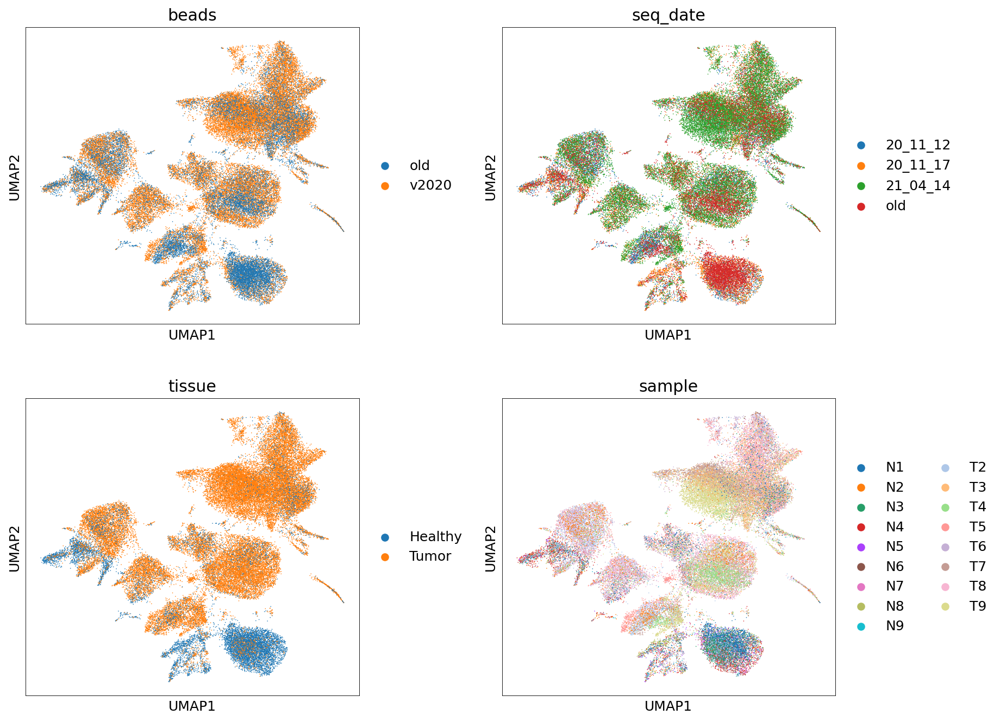

In [45]:
sc.pl.umap(cdata, color = ['beads', 'seq_date', 'tissue', 'sample'], ncols = 2, wspace = 0.3, save = False)

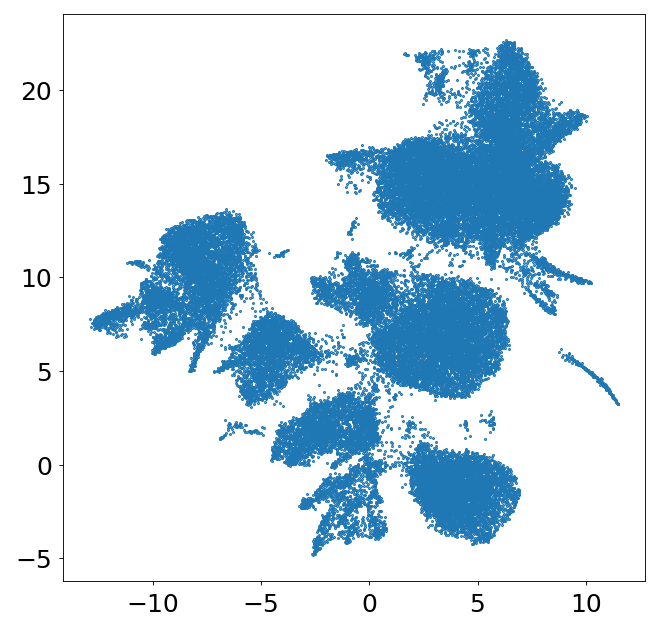

In [46]:
plt.scatter(cdata.obsm['X_umap'][:,0], cdata.obsm['X_umap'][0:,1], s = 0.2)

In [49]:
sce.exporting.spring_project(cdata, project_dir = project_dir, 
                             embedding_method = 'umap', subplot_name = plot_name, cell_groupings = catvars,
                            custom_color_tracks = contvars)

Writing subplot to /Users/justina/Documents/mokslai/MAGISTRAS/MAGISTRINIS/data_and_spring/SPRING_dev-master/kidney_spring/kidney_2022/kidney_v0_156_v2000


/Users/justina/opt/anaconda3/envs/singlec4/lib/python3.8/site-packages/scanpy/external/exporting.py:159: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif is_categorical(adata.obs[obs_name]):
/Users/justina/opt/anaconda3/envs/singlec4/lib/python3.8/site-packages/scanpy/external/exporting.py:175: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif not is_categorical(adata.obs[obs_name]):


In [50]:
sce.exporting.spring_project(cdata, project_dir = project_dir, 
                             embedding_method = 'X_draw_graph_fa', subplot_name = plot_name + '_spring', cell_groupings = catvars,
                            custom_color_tracks = contvars)

Writing subplot to /Users/justina/Documents/mokslai/MAGISTRAS/MAGISTRINIS/data_and_spring/SPRING_dev-master/kidney_spring/kidney_2022/kidney_v0_156_v2000_spring


/Users/justina/opt/anaconda3/envs/singlec4/lib/python3.8/site-packages/scanpy/external/exporting.py:159: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif is_categorical(adata.obs[obs_name]):
/Users/justina/opt/anaconda3/envs/singlec4/lib/python3.8/site-packages/scanpy/external/exporting.py:175: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif not is_categorical(adata.obs[obs_name]):


## Corrections to export properly

For some reason the plot in SPRING application is a mirror image of a plot I get plotting X_umap coordinates. Adjusting the coordinates to be portrayed properly in SPRING app. 

In [51]:
embedding = cdata.obsm['X_umap']
coords = embedding - embedding.min(0)[None,:]
coords = coords * (np.array([1000, 1000]) / coords.ptp(0))[None,:] + np.array([200,-200])[None,:]
coords[:,1] = coords[:,1]*(-1)

In [52]:
#subplot path
subplot_path = project_dir + '/' + plot_name
subplot_path

'/Users/justina/Documents/mokslai/MAGISTRAS/MAGISTRINIS/data_and_spring/SPRING_dev-master/kidney_spring/kidney_2022/kidney_v0_156_v2000'

In [53]:
#saving the new coordinates to subplot folder
np.savetxt('%s/coordinates.txt'%(subplot_path),
               np.hstack((np.arange(len(embedding))[:,None], coords)),
               fmt='%i,%.6f,%.6f')

Checking in SPRING if the plot looks the same as X_umap plot: it does now

In [55]:
#save plot parameters
rz.save_stuff(path=project_dir+'/'+plot_name+'/params',stuff=pdict)


In [59]:
#filename for saving the cdata
fname = 'backups_JZ_2022/%s_batch_corrected_%dx%d_%s.h5ad'%(plot_name, cdata.shape[0],cdata.shape[1],rz.now())
fname                                                       

'backups_JZ_2022/kidney_v0_156_v2000_batch_corrected_51196x2000_220121_15h23.h5ad'

In [ ]:
#for some reason adata.write does not allow dict of dicts, removing cdata.uns['spring_params']
cdata.uns.pop('spring_params')
cdata.uns


In [62]:
cdata.write(fname)

In [63]:
#no need to save obs as only 'n_counts' appeared 

In [64]:
#okay, apparently exporting spring plot did not work correctly and did not save the cell filter
cell_ix = np.arange(len(pdict['cell_mask']))[pdict['cell_mask']]


In [66]:
print(len(pdict['cell_mask']), sum(pdict['cell_mask']))

51196 51196


In [67]:
np.savetxt(subplot_path + '/cell_filter.txt', cell_ix, fmt='%i')
np.save(subplot_path + '/cell_filter.npy', cell_ix)

In [68]:
#also noticed the colorbar saturation levels are not right because my adata raw is not normalized, however
#I want to keep it that way so overwriting manually

In [69]:
adata.X.sum(axis=1)

matrix([[10000.001],
        [10000.   ],
        [10000.001],
        ...,
        [ 9999.999],
        [ 9999.999],
        [ 9999.999]], dtype=float32)

In [70]:
E = adata.X.tocsc() #normalized

In [71]:
from scanpy.external.exporting import (_write_color_tracks,
                                 _get_color_stats_genes,
                                 _get_color_stats_custom,
                                 _write_color_stats
                                 )

In [72]:
gene_list = adata.var_names.values

In [73]:
continuous_extras = {}
for obs_name in contvars:
       continuous_extras[obs_name] = np.array(cdata.obs[obs_name])

In [74]:
# Create and write a dictionary of color profiles to be used by the visualizer
color_stats = {}
color_stats = _get_color_stats_genes(color_stats, E[cell_ix, :], gene_list)
color_stats = _get_color_stats_custom(color_stats, continuous_extras)
_write_color_stats(subplot_path + '/color_stats.json', color_stats)